In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gdal
import osgeo as osr
import geopandas as gpd
import numpy as np
import random
import shapefile as shp
import imutils
from imutils import paths
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
aerial_pred_colours = np.load('aerial_pred_colours_1m.npy').astype(int)

In [3]:
aerial_pred_colours.shape

(2313, 3514, 3)

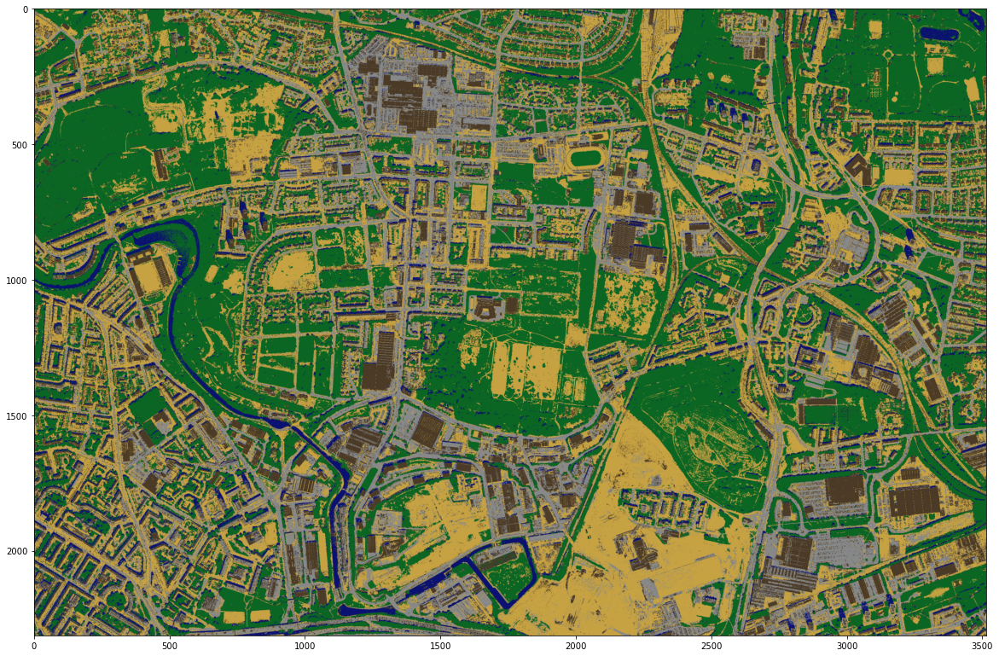

In [4]:
plt.figure(figsize = (20,20))
plt.imshow(aerial_pred_colours)
#plt.imsave('aerial_pred_colours.png', aerial_pred_colours.astype('uint8'))

In [5]:
aerial_predictions = np.load('aerial_predictions_1m.npy').astype(int)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f24e865ecd0>]],
      dtype=object)

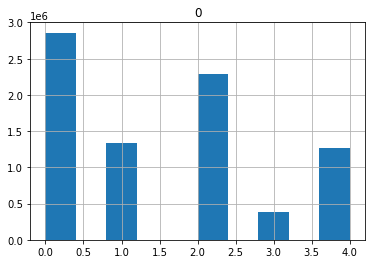

In [7]:
pd.DataFrame(aerial_predictions).hist()

In [4]:
total_aerial_pred_colours = np.load('total_aerial_pred_colours_1m.npy').astype(int)

In [3]:
print(total_aerial_pred_colours.shape)

(6989, 10999, 3)


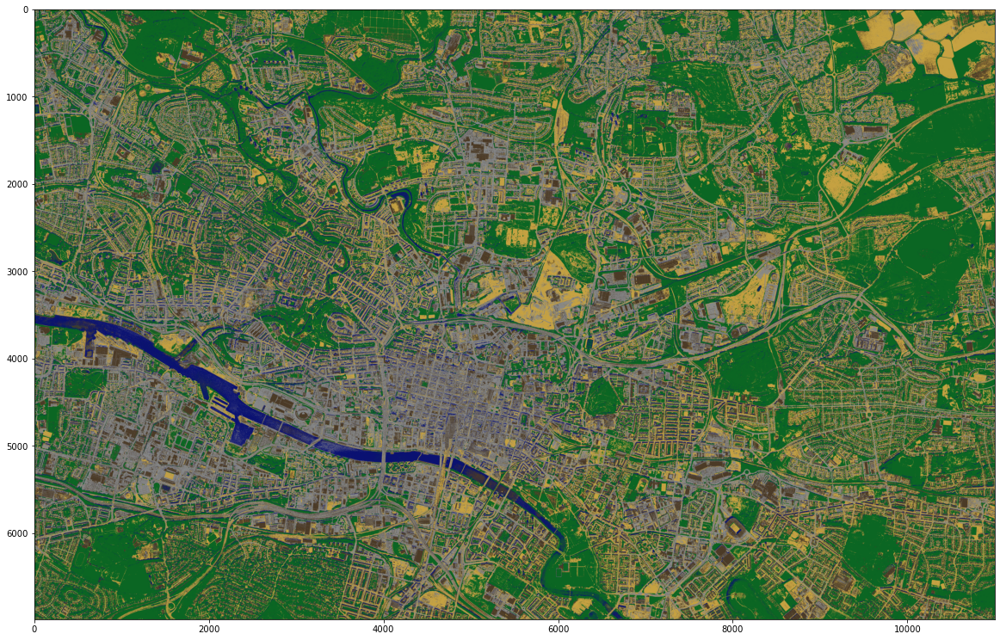

In [4]:
plt.figure(figsize = (20,20))
plt.imshow(total_aerial_pred_colours)
#plt.imsave('aerial_pred_colours.png', aerial_pred_colours.astype('uint8'))

In [14]:
#plt.imsave('total_aerial_pred_colours.png', total_aerial_pred_colours.astype('uint8'))

In [ ]:
#tartoka
#i es j range(image.shape[o] image.shape[1])
#ha mask nem fekete akkor berakja az ij pontokon a szineket

In [5]:
classes_shp = gpd.read_file('merged_derelict_vacant_final.dbf')
classes_df = pd.DataFrame(classes_shp)

In [20]:
#### Creating Mask##### Run this whole block to define the functions.

def random_colour():
    colour=[]
    for _ in range(3):
        colour.append(random.randint(1, 255))
    return tuple(colour)


def geo2imagexy(dataset, x, y):
    trans = dataset.GetGeoTransform()
    a = np.array([[trans[1], trans[2]], [trans[4], trans[5]]])
    b = np.array([x - trans[0], y - trans[3]])
    return np.linalg.solve(a, b)

def getSRSPair(dataset):
    prosrs = osr.SpatialReference()
    prosrs.ImportFromWkt(dataset.GetProjection())
    geosrs = prosrs.CloneGeogCS()
    return prosrs, geosrs

def lonlat2geo(dataset, lon, lat):
    prosrs, geosrs = getSRSPair(dataset)
    ct = osr.CoordinateTransformation(geosrs, prosrs)
    coords = ct.TransformPoint(lon, lat)
    return coords[:2]

def run_png(tif_path,shp_path,out_path, classes):
    shape_data = gpd.read_file('merged_derelict_vacant_final.dbf')
    tif_data = gdal.Open(tif_path)
    tif_datashape = tif_data.ReadAsArray()
    print(tif_datashape.shape)
    level_xiao=[]
    shapes=[]
    kkt = []
    for index, row in shape_data.iterrows():
        b = row['geometry']
        if b is None:
            continue
        if b.geom_type == "MultiPolygon":
            for pg in b:
                for ji in pg.exterior.coords[:]:
                    #print("#"*20)
                    (x,y)=ji[0],ji[1]
                    #(xt,yt)=lonlat2geo(tif_data,x,y)
                    (xt,yt)=geo2imagexy(tif_data,x,y)
                    level_xiao.append((xt,yt))
                shapes.append((level_xiao, row['site_type'], row.name))
                level_xiao=[]
        else:
            for ji in b.exterior.coords[:]:
                (x,y)=ji[0],ji[1]
                #(xt,yt)=lonlat2geo(tif_data,x,y)
                (xt,yt)=geo2imagexy(tif_data,x,y)
                level_xiao.append((xt,yt))
            shapes.append((level_xiao, row['site_type'], row.name))
            level_xiao=[]
    images = np.zeros((tif_datashape.shape[1],tif_datashape.shape[2],3))
    indices = np.zeros((tif_datashape.shape[1],tif_datashape.shape[2],3))-1
    colours = {}
    for classname in classes:
        colour=random_colour()
        while colour in colours.values():
            colour=random_colour()
        colours[classname] = colour
        
    print(colours)
    
    for polygon, site_type, index in shapes:
        np_polygon=np.array([polygon], dtype=np.int32)
        cv2.fillPoly(images,np_polygon,colours[site_type])
        cv2.fillPoly(indices, np_polygon, (index, 0, 0))
    indices = indices[:,:, 0]
    cv2.imwrite(out_path,images)
    print(np.unique(images,return_counts=True))
    return colours, indices.astype('int')

In [21]:
colours_per_class, indices_per_pixel = run_png('1_m_aerial_final.tif', 
        'merged_derelict_vacant_final.dbf', 
        'total_per_class_masks.png',
        classes_df.site_type.unique()) 

(4, 6989, 10999)
{'Derelict': (97, 137, 247), 'Vacant Land': (89, 106, 59)}
(array([  0.,  59.,  89.,  97., 106., 137., 247.]), array([213072735,   1956635,   1956635,   3891131,   1956635,   3891131,
         3891131]))


In [22]:
np.save('polygon_index_per_pixel.npy', indices_per_pixel)

In [29]:
indices_per_pixel.shape

(6989, 10999)

In [117]:
classes_df.head(5)

,local_auth,site_code,site_name,address,east,north,site_size,site_type,location,owner_1,owner_2,period,previous_u,developmen,datazone,layer,path,geometry
0,Glasgow City,3710,None,395 OLD SHETTLESTON ROAD,264157,664391,0.24,Derelict,Site in settlement with population equal to or...,Private: Other,Not applicable (i.e. only one owner),2001-2004,"Residential - Hotels, Hostels etc",Developable - Medium Term,S01010147,derelict_clipped_final2,/Users/reka/Documents/Glasgow_University/Urban...,"POLYGON ((264151.482 664430.086, 264181.343 66..."
1,Glasgow City,358,None,CARBETH STREET/ BARDOWIE STREET.,258953,667880,0.13,Derelict,Site in settlement with population equal to or...,Public: Local Authority,Private: Other,1981-1985,Community & Health,Developable - Short Term,S01010311,derelict_clipped_final2,/Users/reka/Documents/Glasgow_University/Urban...,"POLYGON ((258941.081 667855.924, 258936.700 66..."
2,Glasgow City,529,None,W OF DARNICK ST,261387,666722,3.78,Derelict,Site in settlement with population equal to or...,Private: Other,Not applicable (i.e. only one owner),1980 or earlier,Transport,Uneconomic to Develop/Soft End Use,S01010229,derelict_clipped_final2,/Users/reka/Documents/Glasgow_University/Urban...,"POLYGON ((261280.000 666802.000, 261473.000 66..."
3,Glasgow City,3913,None,350-354 PROVANMILL ROAD,262869,667178,0.11,Derelict,Site in settlement with population equal to or...,Private: Other,Not applicable (i.e. only one owner),2007,Retailing,Developable - Short Term,S01010180,derelict_clipped_final2,/Users/reka/Documents/Glasgow_University/Urban...,"POLYGON ((262880.050 667151.400, 262868.200 66..."
4,Glasgow City,2059,None,NORTH OF 49 COWLAIRS ROAD,260267,667700,0.47,Derelict,Site in settlement with population equal to or...,Private: Other,Public: Local Authority,1986-1990,Utility Services,Developable - Undetermined,S01010223,derelict_clipped_final2,/Users/reka/Documents/Glasgow_University/Urban...,"POLYGON ((260269.000 667680.000, 260269.277 66..."


In [26]:
total_per_class_masks_path = "./total_per_class_masks.png"
total_per_class_masks = cv2.imread(total_per_class_masks_path)
total_per_class_masks = total_per_class_masks /255

In [27]:
alpha_channel = np.ones((*total_per_class_masks.shape[:2], 1))
per_class_masks_transparent = np.append(total_per_class_masks, alpha_channel, axis=2)
per_class_masks_transparent.shape

(6989, 10999, 4)

In [28]:
for i in range(per_class_masks_transparent.shape[0]):
    for j in range(per_class_masks_transparent.shape[1]):
        if np.all(per_class_masks_transparent[i, j, :] == [0, 0, 0, 1]):
            per_class_masks_transparent[i, j, :] = np.array([0, 0, 0, 0])

KeyboardInterrupt: 

TypeError: imsave() missing 1 required positional argument: 'arr'

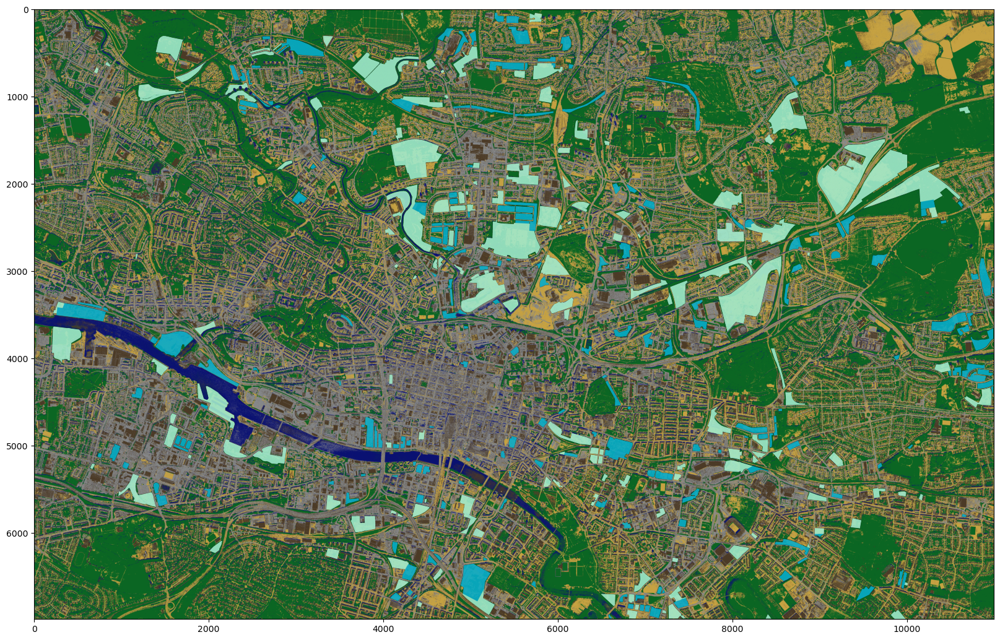

In [24]:
plt.figure(figsize = (20,20))
plt.imshow(total_aerial_pred_colours)
plt.imshow(per_class_masks_transparent, alpha=0.9)
plt.imsave('total_aerial_pred_vacant_derelict.png')

In [24]:
total_aerial_predictions = np.load('total_aerial_predictions_1m.npy').astype(int).reshape(total_aerial_pred_colours.shape[:2])

In [8]:
total_aerial_predictions.shape

(6989, 10999)

In [30]:
#tartoka
#i es j range(image.shape[o] image.shape[1])
#ha mask nem fekete akkor berakja az ij pontokon a szineket

tartoka = np.zeros(total_aerial_predictions.shape).astype('int') -1
for i in range(indices_per_pixel.shape[0]):
    for j in range (indices_per_pixel.shape[1]):
        if indices_per_pixel[i, j] != -1:
            tartoka[i, j] = total_aerial_predictions[i, j]
            
tartoka_filtered = tartoka[tartoka != -1]
indices_per_pixel_filtered = indices_per_pixel[indices_per_pixel != -1]

In [31]:
print(indices_per_pixel_filtered.shape, tartoka_filtered.shape)

(5847766,) (5847766,)


In [10]:
tartoka_filtered.shape

(5847766,)

In [11]:
np.save('clipped_predictions.npy', tartoka_filtered)

In [35]:
class_id_to_string = {
    0: 'vegetation',
    1: 'concrete',
    2: 'bare soil',
    3: 'water',
    4: 'buildings'
}

clipped_pred = pd.DataFrame({'class_id': tartoka_filtered, 'polygon_id': indices_per_pixel_filtered})
#clipped_pred['class_name'] = clipped_pred.class_id.apply(lambda id: class_id_to_string[id])
clipped_pred.to_csv('clipped_predictions.csv')

In [34]:
pred_metadata = clipped_pred.merge(right=classes_df, how='left', left_on='polygon_id', right_index=True)

MemoryError: Unable to allocate 758. MiB for an array with shape (17, 5847766) and data type object

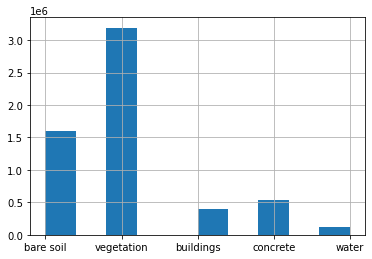

In [13]:
clipped_pred['class_name'].hist()

Text(0, 0.5, 'Percentage')

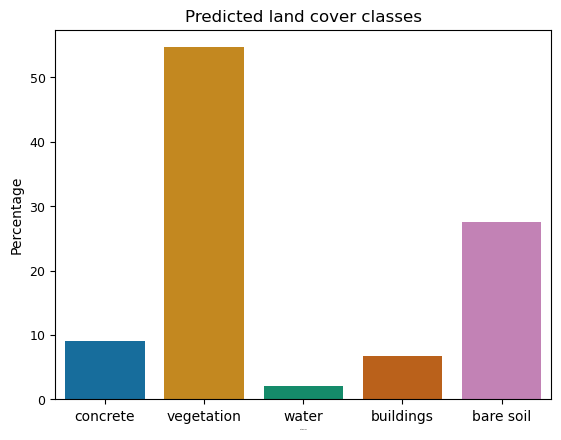

In [22]:
plt.style.use('default')
clipped_pred_counts = clipped_pred['class_name'].value_counts(normalize=True, sort=False)

clipped_pred_data = [
    {'class_name': class_name, 'percentage': percentage*100} for 
    (class_name), percentage in dict(clipped_pred_counts).items()
]

df_clipped_pred = pd.DataFrame(clipped_pred_data)

p = sns.barplot(x='class_name', y="percentage", data=df_clipped_pred, palette='colorblind')
#plt.setp(p.get_xticklabels(), rotation=90, fontsize=9) 
plt.setp(p.get_yticklabels(), fontsize=9) 

#plt.legend(prop={'size': 8.5})
plt.title('Predicted land cover classes', fontsize=12)
plt.xlabel('Categories', fontsize=0)
plt.ylabel('Percentage', fontsize=10)
#plt.savefig('period.png')

In [23]:
clipped_pred_data

[{'class_name': 'concrete', 'percentage': 9.088239850910588},
 {'class_name': 'vegetation', 'percentage': 54.59276243269652},
 {'class_name': 'water', 'percentage': 2.040984540079066},
 {'class_name': 'buildings', 'percentage': 6.818227678740907},
 {'class_name': 'bare soil', 'percentage': 27.45978549757292}]

In [23]:
classes_df['site_type'].unique()

array(['Derelict', 'Vacant Land'], dtype=object)

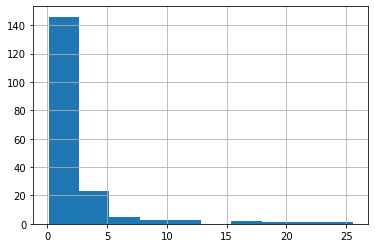

In [42]:
classes_df[(classes_df.site_type == 'Derelict')]['site_size'].astype(float).hist()

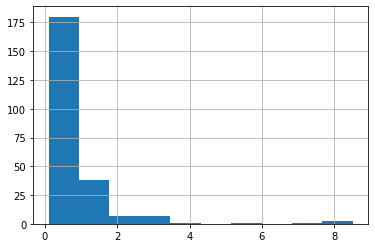

In [40]:
classes_df[(classes_df.site_type == 'Vacant Land')]['site_size'].astype(float).hist()

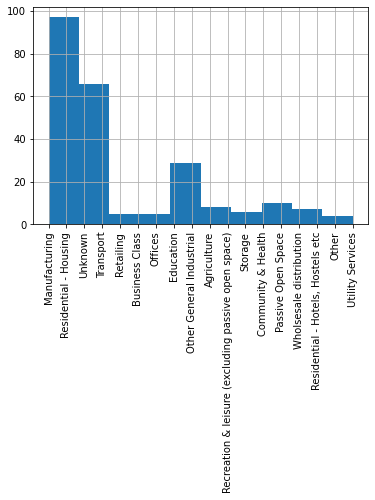

In [46]:
p = classes_df[(classes_df.site_type == 'Vacant Land')]['previous_u'].hist()
plt.xticks(rotation='vertical')
plt.show()

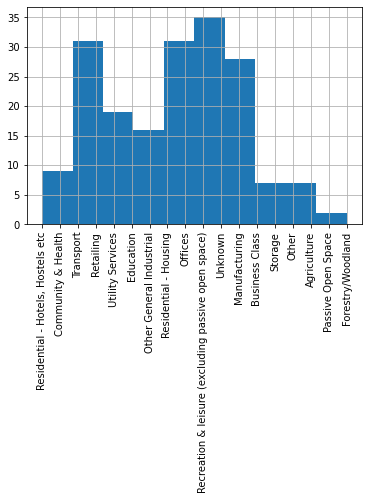

In [47]:
p = classes_df[(classes_df.site_type == 'Derelict')]['previous_u'].hist()
plt.xticks(rotation='vertical')
plt.show()